<font color="#CA0032"><h1 align="left">**Redes Generativas Adversariales (GANs)**</h1></font>

<font color="#6E6E6E"><h1 align="left">**Personajes de Anime: Modelos Deep Learning**</h1></font>

<h2 align="left">Manuel Sánchez-Montañés</h2>

<font color="#6E6E6E"><h2 align="left">manuel.smontanes@gmail.com</h2></font>

In [ ]:
COLAB    = True
GRAPHVIZ = True

In [ ]:
# Extendido de:
# https://github.com/naokishibuya/deep-learning/blob/master/python/dcgan_celeba.ipynb

In [ ]:
if COLAB:
    %tensorflow_version 1.x

import numpy as np
from glob import glob
from tqdm import tqdm
from keras.initializers import RandomNormal
from keras.layers import Dense, Activation, LeakyReLU, BatchNormalization
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

TensorFlow 1.x selected.


Using TensorFlow backend.


## **Loading Dataset**

In [ ]:
if COLAB:
    from google_drive_downloader import GoogleDriveDownloader as gdd
    gdd.download_file_from_google_drive(file_id='1brlEoNd_iFQLM21E-ld7z430EkAoCNN-',
                                        dest_path='./ANIME_PLANET_FACES_COLOUR_ONLY_64.zip',
                                        overwrite=True, unzip=True)

Unzipping...Done.


Now we load all the filenames:

In [ ]:
filenames = np.array(glob('./ANIME_PLANET_FACES_COLOUR_ONLY_64/*.png'))
X_orig = []
for f in tqdm(filenames):
    X_orig.append(plt.imread(f))
X_orig = np.array(X_orig)

100%|██████████| 4231/4231 [00:01<00:00, 2907.19it/s]


Let's examine some sample images.

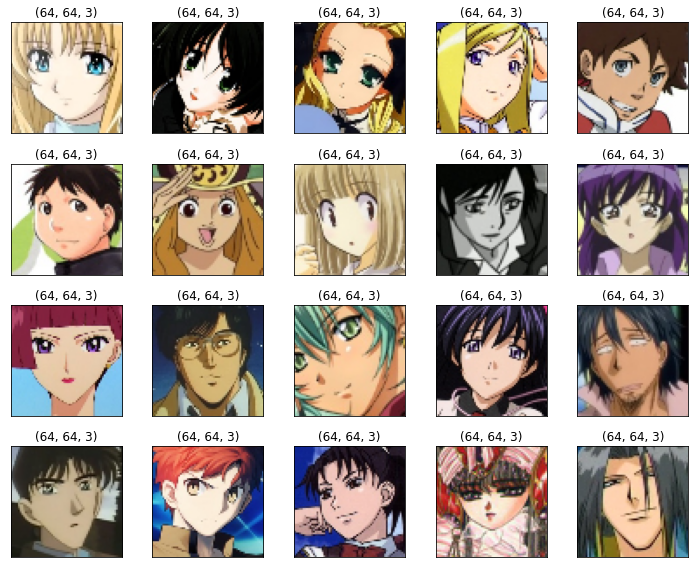

In [ ]:
plt.figure(figsize=(10, 8))
for i in range(20):
    img = X_orig[i]
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(img.shape)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

In [ ]:
X_train_orig, X_test_orig = train_test_split(X_orig, test_size=.3)

In [ ]:
print(X_train_orig.shape)
print(X_test_orig.shape)

(2961, 64, 64, 3)
(1270, 64, 64, 3)


## **Preprocessing and Deprocessing**

Those images are pretty big. We will crop and resize them.

In [ ]:
def crop_image(img, size=(32, 32)):
    # crop
    rows, cols = img.shape[:2]
    crop_r, crop_c = 25, 50
    start_row, start_col = (rows - crop_r) // 2, (cols - crop_c) // 2
    end_row, end_col = rows - start_row, cols - start_row
#    img = img[start_row:end_row, start_col:end_col, :]
    # resize
    #img = imresize(img, size)
    img = (255*img).astype(np.uint8)
    img = np.array(Image.fromarray(img).resize(size))
    return img

In [ ]:
X_train = []
for img in tqdm(X_train_orig):
    X_train.append(crop_image(img))
X_train = np.array(X_train)

100%|██████████| 2961/2961 [00:00<00:00, 8473.77it/s]


In [ ]:
X_test = []
for img in tqdm(X_test_orig):
    X_test.append(crop_image(img))
X_test = np.array(X_test)

100%|██████████| 1270/1270 [00:00<00:00, 9418.05it/s]


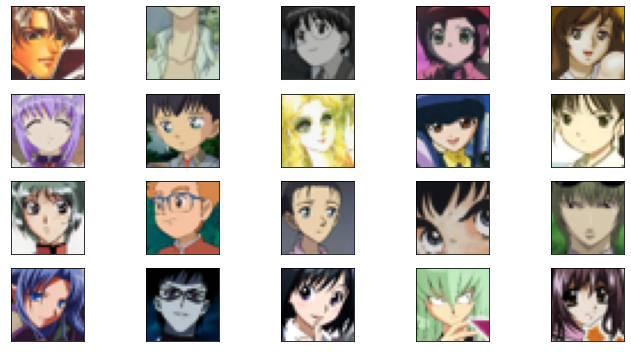

In [ ]:
plt.figure(figsize=(10, 5))
for i in range(20):
    img = X_train[i]
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

As usual, we need preprocessing and later deprocessing of the images.  

As we will see later on, the generator is using `tanh` activation, for which we need to preprocess the image data into the range between -1 and 1.

In [ ]:
X_train = X_train / 255.

In [ ]:
X_train.min(), X_train.max()

(0.0, 1.0)

In [ ]:
def preprocess(x):
    return 2*x-1

def deprocess(x):
    return np.clip((x+1)/2, 0, 1) # make sure to use uint8 type otherwise the image won't display properly

In [ ]:
X_train_norm = preprocess(X_train)
X_test_norm  = preprocess(X_test)

## **Generator**

The generator takes a latent sample and produces a color Anime face image.

In [ ]:
def make_generator(input_size, leaky_alpha, init_stddev):
    # generates images in (32,32,3)
    return Sequential([
        Dense(4*4*512, input_shape=(input_size,), 
#              kernel_initializer=RandomNormal(stddev=init_stddev)
             ),
        Reshape(target_shape=(4, 4, 512)),
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2DTranspose(256, kernel_size=5, strides=2, padding='same', 
#                        kernel_initializer=RandomNormal(stddev=init_stddev)
                       ), # 8x8
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', 
#                        kernel_initializer=RandomNormal(stddev=init_stddev)
                       ), # 16x16
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', 
#                        kernel_initializer=RandomNormal(stddev=init_stddev)
                       ), # 32x32
        Activation('tanh')
    ])

## **Discriminator**

The discriminator is a classifier to tell if the input image is real or fake.  

In [ ]:
def make_discriminator(leaky_alpha, init_stddev):
    # classifies images in (64,64,3)
    return Sequential([        
        Conv2D(64, kernel_size=5, strides=2, padding='same', 
               kernel_initializer=RandomNormal(stddev=init_stddev),    # 16x16
               input_shape=(32, 32, 3)),
        LeakyReLU(alpha=leaky_alpha),
        Conv2D(128, kernel_size=5, strides=2, padding='same', 
               kernel_initializer=RandomNormal(stddev=init_stddev)),   # 8x8
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Conv2D(256, kernel_size=5, strides=2, padding='same', 
               kernel_initializer=RandomNormal(stddev=init_stddev)),   # 4x4
        BatchNormalization(),
        LeakyReLU(alpha=leaky_alpha),
        Flatten(),
        Dense(1, kernel_initializer=RandomNormal(stddev=init_stddev)),
        Activation('sigmoid')        
    ])

## **DCGAN**

We connect the generator and the discriminator to make a DCGAN.

In [ ]:
# beta_1 is the exponential decay rate for the 1st moment estimates in Adam optimizer
def make_DCGAN(sample_size, 
               g_learning_rate, 
               g_beta_1,
               d_learning_rate,
               d_beta_1,
               leaky_alpha,
               init_std):
    # generator
    generator = make_generator(sample_size, leaky_alpha, init_std)

    # discriminator
    discriminator = make_discriminator(leaky_alpha, init_std)
    discriminator.compile(optimizer=Adam(lr=d_learning_rate, beta_1=d_beta_1), loss='binary_crossentropy')
    
    # GAN
    gan = Sequential([generator, discriminator])
    gan.compile(optimizer=Adam(lr=g_learning_rate, beta_1=g_beta_1), loss='binary_crossentropy')
    
    return gan, generator, discriminator

## **Training DCGAN**

The below is a list of utility functions:

In [ ]:
def make_latent_samples(n_samples, sample_size):
    #return np.random.uniform(-1, 1, size=(n_samples, sample_size))
    return np.random.normal(loc=0, scale=1, size=(n_samples, sample_size))

def make_trainable(model, trainable):
    for layer in model.layers:
        layer.trainable = trainable
        
def make_labels(size):
    return np.ones([size, 1]), np.zeros([size, 1])

def show_losses(losses):
    losses = np.array(losses)
    
    fig, ax = plt.subplots()
    plt.plot(losses.T[0], label='Discriminator')
    plt.plot(losses.T[1], label='Generator')
    plt.title("Validation Losses")
    plt.legend()
    plt.show()
    
def show_images(generated_images, cols=10):
    n_images = len(generated_images)
    rows = n_images//cols
    
    plt.figure(figsize=(10, 8))
    for i in range(n_images):
        img = deprocess(generated_images[i])
        ax = plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show()

In the training loop, we need to load a batch of face images and use them as real images.

### **Training**

I specify a smaller learning rate for the generater and a bigger learning rate for the discriminator.

In [ ]:
X_train_norm.std(), X_train_norm.mean(), X_train_norm.min(), X_train_norm.max()

(0.5648427675126536, 0.025401277162756353, -1.0, 1.0)

In [ ]:
g_learning_rate=0.0001
g_beta_1=0.5
d_learning_rate=0.001
d_beta_1=0.5
leaky_alpha=0.2
init_std=0.02


smooth=0.1
sample_size=100 # latent sample size (i.e. 100 random numbers)
epochs=100 # 3
batch_size=16 # 128  # train batch size
eval_size=16    # evaluate size
show_details=True

# labels for the batch size and the test size
y_train_real, y_train_fake = make_labels(batch_size)
y_eval_real,  y_eval_fake  = make_labels(eval_size)

# create a GAN, a generator and a discriminator
gan, generator, discriminator = make_DCGAN(
    sample_size, 
    g_learning_rate, 
    g_beta_1,
    d_learning_rate,
    d_beta_1,
    leaky_alpha,
    init_std)

losses = []

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


  0%|          | 0/185 [00:00<?, ?it/s]

/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
  1%|          | 1/185 [00:09<30:11,  9.85s/it]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:15<00:00, 12.21it/s]


Epoch:   1/100 Discriminator Loss: 3.1418 Generator Loss: 0.1512


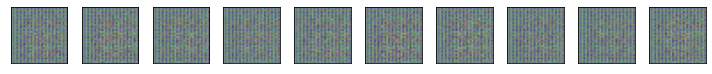

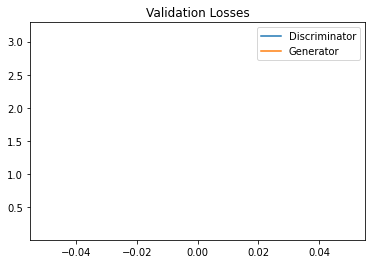

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.74it/s]


Epoch:   2/100 Discriminator Loss: 1532.8231 Generator Loss: 4.7226


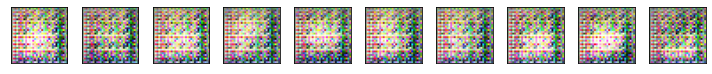

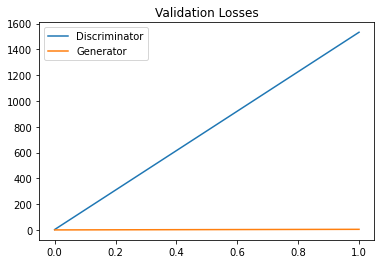

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.36it/s]


Epoch:   3/100 Discriminator Loss: 487.5609 Generator Loss: 1.5854


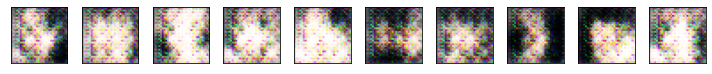

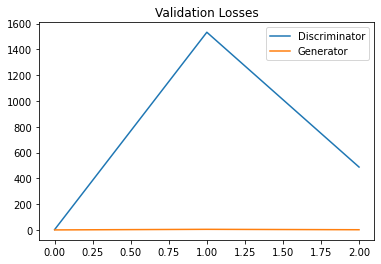

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 34.04it/s]


Epoch:   4/100 Discriminator Loss: 0.5976 Generator Loss: 1.1957


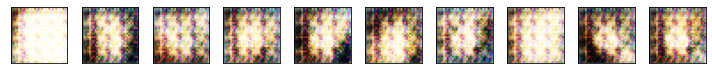

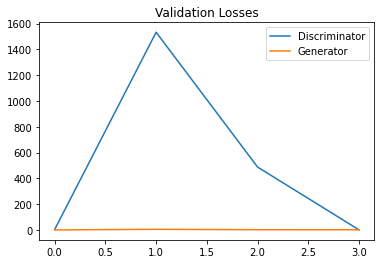

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.84it/s]


Epoch:   5/100 Discriminator Loss: 802.3161 Generator Loss: 1.3859


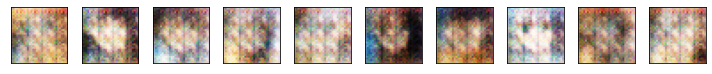

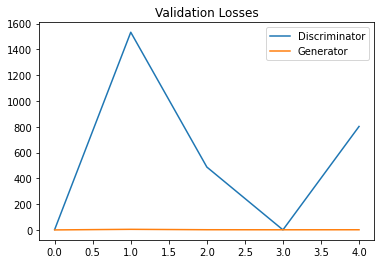

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.37it/s]


Epoch:   6/100 Discriminator Loss: 67.6426 Generator Loss: 1.8957


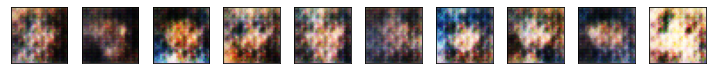

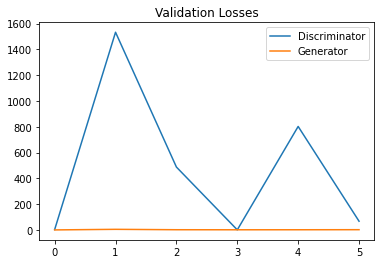

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 33.15it/s]


Epoch:   7/100 Discriminator Loss: 3.7999 Generator Loss: 0.0456


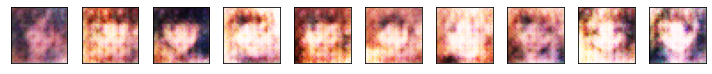

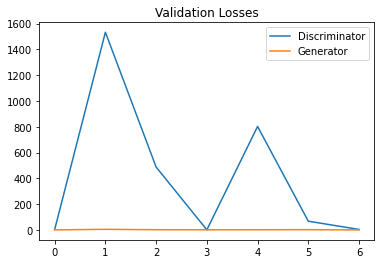

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.79it/s]


Epoch:   8/100 Discriminator Loss: 0.6519 Generator Loss: 0.8547


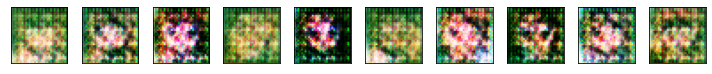

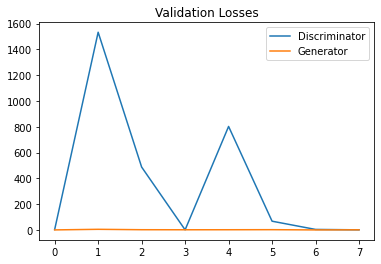

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.24it/s]


Epoch:   9/100 Discriminator Loss: 699.8921 Generator Loss: 1.4249


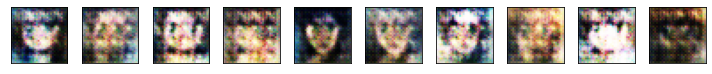

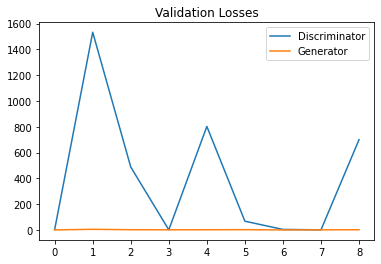

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.41it/s]


Epoch:  10/100 Discriminator Loss: 0.3658 Generator Loss: 1.3073


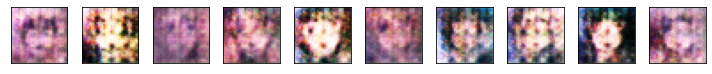

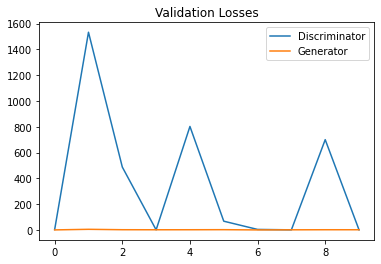

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.54it/s]


Epoch:  11/100 Discriminator Loss: 0.7029 Generator Loss: 0.7486


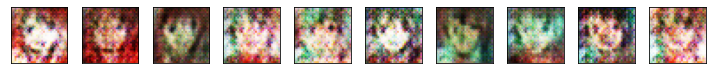

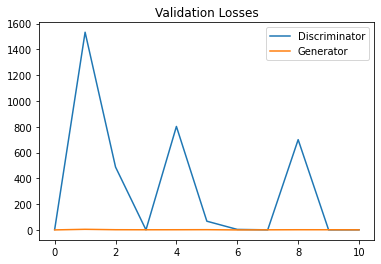

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.23it/s]


Epoch:  12/100 Discriminator Loss: 0.4873 Generator Loss: 1.1462


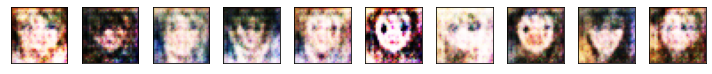

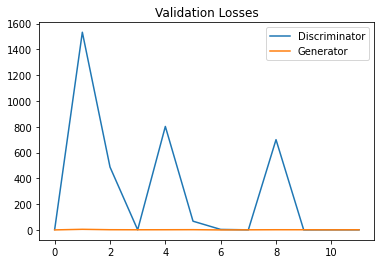

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.95it/s]


Epoch:  13/100 Discriminator Loss: 119.5784 Generator Loss: 1.8385


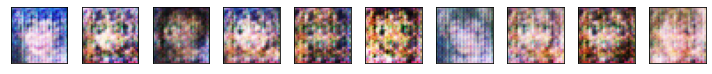

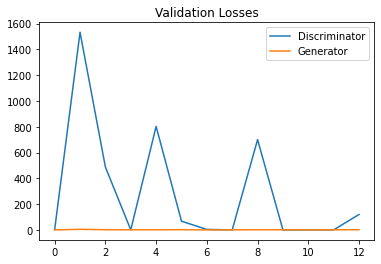

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.70it/s]


Epoch:  14/100 Discriminator Loss: 87.7012 Generator Loss: 1.1203


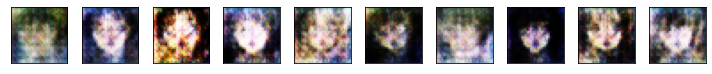

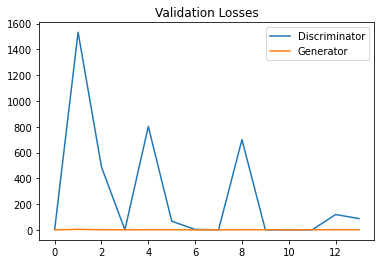

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 32.00it/s]


Epoch:  15/100 Discriminator Loss: 1369.1400 Generator Loss: 0.1642


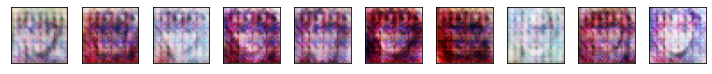

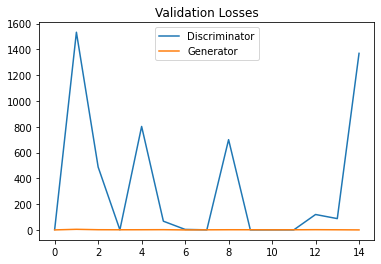

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.76it/s]


Epoch:  16/100 Discriminator Loss: 0.9809 Generator Loss: 0.5853


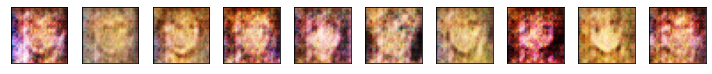

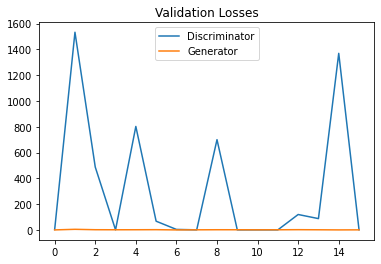

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.59it/s]


Epoch:  17/100 Discriminator Loss: 109.0190 Generator Loss: 1.5262


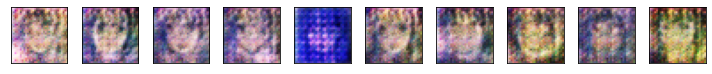

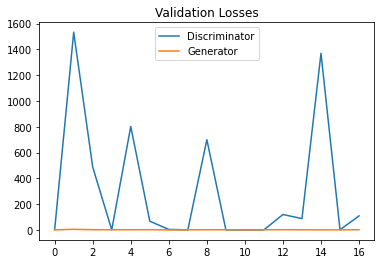

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.86it/s]


Epoch:  18/100 Discriminator Loss: 27.3124 Generator Loss: 2.0771


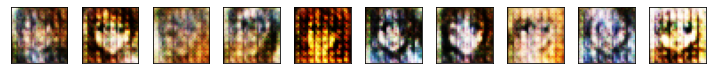

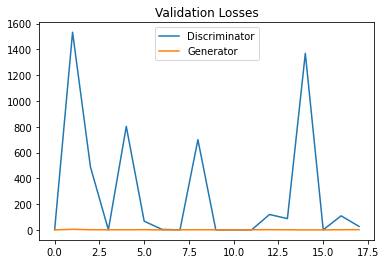

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.51it/s]


Epoch:  19/100 Discriminator Loss: 0.2220 Generator Loss: 2.0678


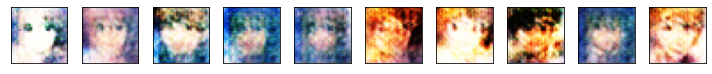

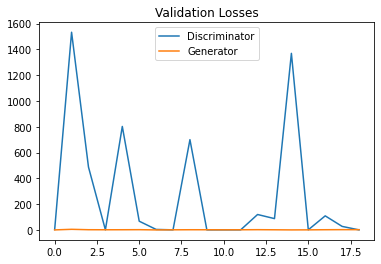

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.62it/s]


Epoch:  20/100 Discriminator Loss: 1.2839 Generator Loss: 0.4761


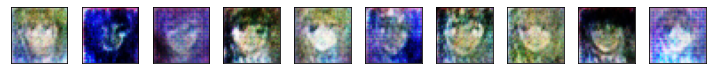

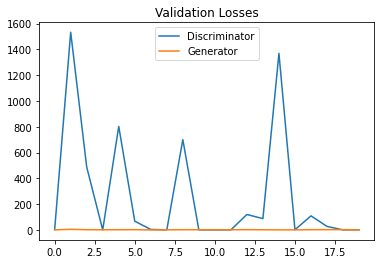

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.31it/s]


Epoch:  21/100 Discriminator Loss: 1.0549 Generator Loss: 0.4518


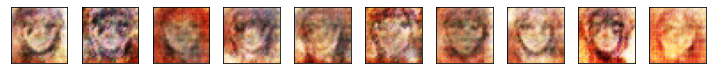

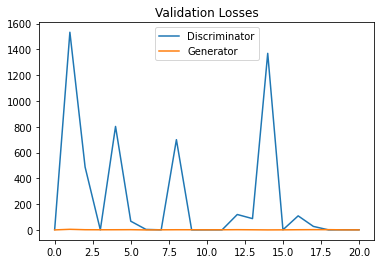

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.68it/s]


Epoch:  22/100 Discriminator Loss: 702.8440 Generator Loss: 1.1627


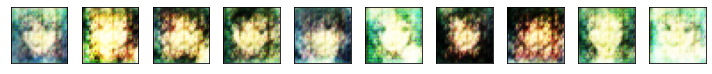

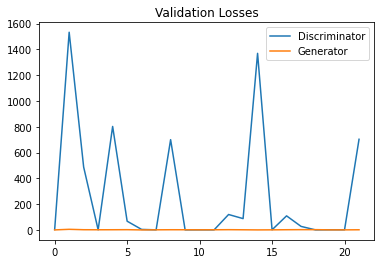

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.64it/s]


Epoch:  23/100 Discriminator Loss: 61.4456 Generator Loss: 0.6115


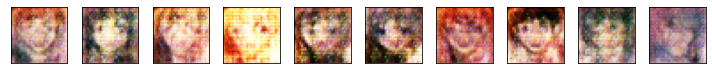

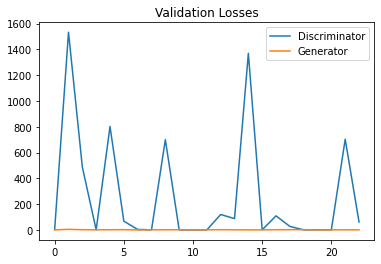

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.45it/s]


Epoch:  24/100 Discriminator Loss: 17.6115 Generator Loss: 2.0113


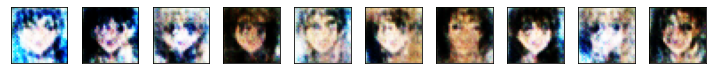

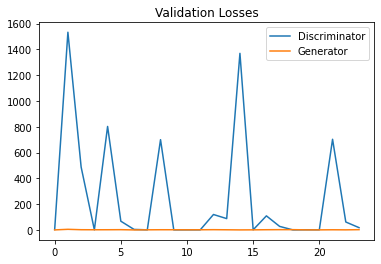

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.36it/s]


Epoch:  25/100 Discriminator Loss: 20.9419 Generator Loss: 1.0825


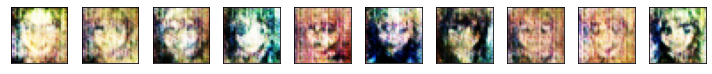

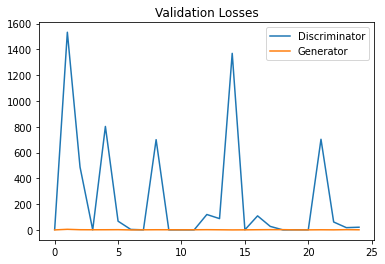

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.14it/s]


Epoch:  26/100 Discriminator Loss: 38.0967 Generator Loss: 0.8436


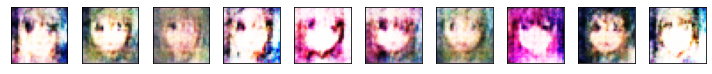

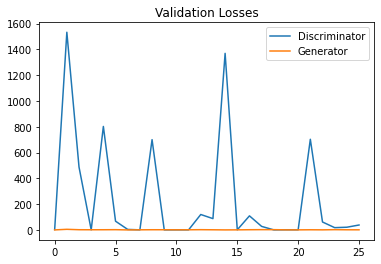

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.40it/s]


Epoch:  27/100 Discriminator Loss: 0.5345 Generator Loss: 1.0549


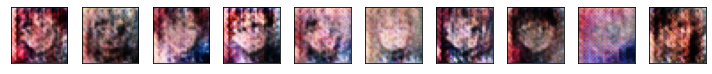

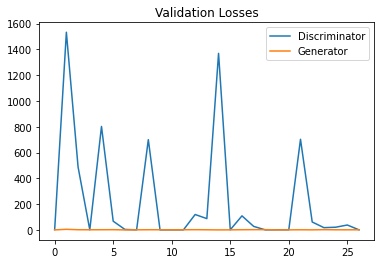

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.20it/s]


Epoch:  28/100 Discriminator Loss: 20.6627 Generator Loss: 1.0912


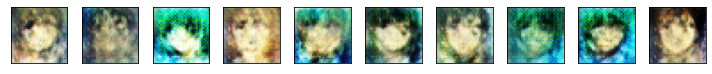

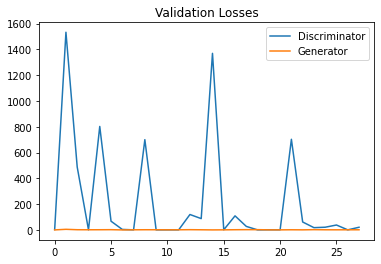

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:05<00:00, 31.33it/s]


Epoch:  29/100 Discriminator Loss: 25.5137 Generator Loss: 0.5578


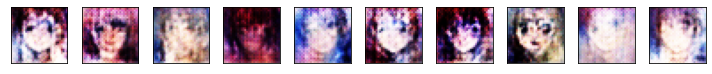

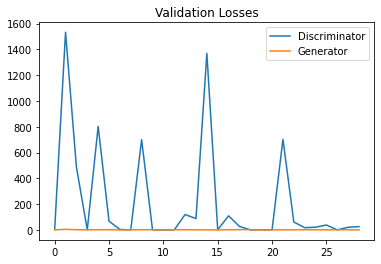

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.73it/s]


Epoch:  30/100 Discriminator Loss: 0.6439 Generator Loss: 0.9544


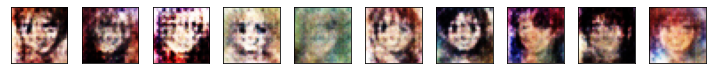

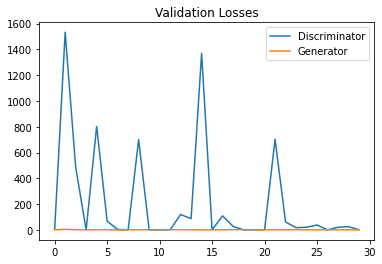

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.43it/s]


Epoch:  31/100 Discriminator Loss: 125.3879 Generator Loss: 1.3599


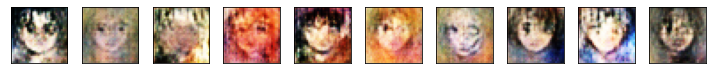

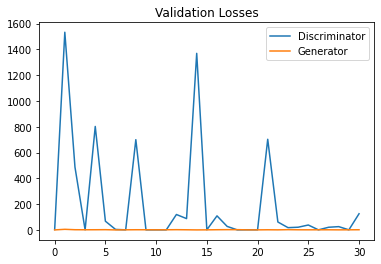

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.55it/s]


Epoch:  32/100 Discriminator Loss: 0.5506 Generator Loss: 1.1424


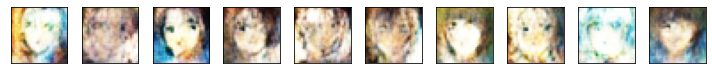

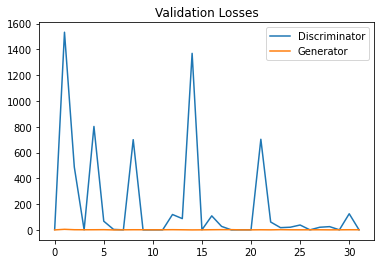

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.66it/s]


Epoch:  33/100 Discriminator Loss: 0.2117 Generator Loss: 1.9746


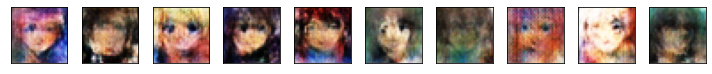

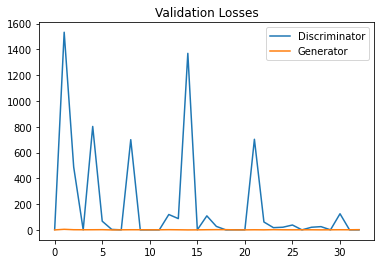

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.29it/s]


Epoch:  34/100 Discriminator Loss: 1.3679 Generator Loss: 0.3933


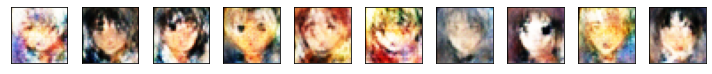

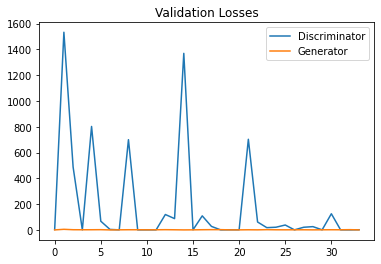

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.01it/s]


Epoch:  35/100 Discriminator Loss: 15.6279 Generator Loss: 1.1720


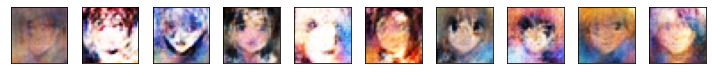

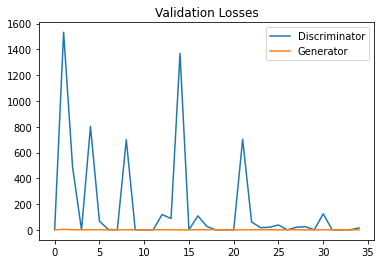

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.18it/s]


Epoch:  36/100 Discriminator Loss: 27.6698 Generator Loss: 1.2605


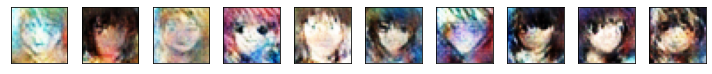

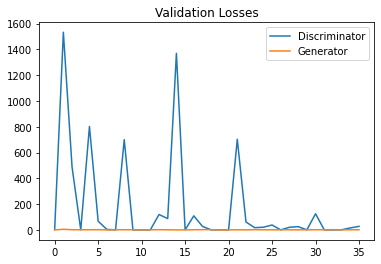

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.53it/s]


Epoch:  37/100 Discriminator Loss: 0.1972 Generator Loss: 2.5306


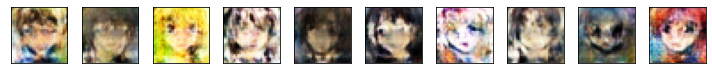

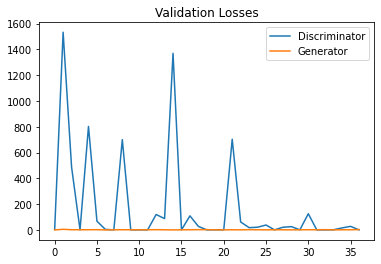

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.34it/s]


Epoch:  38/100 Discriminator Loss: 0.1660 Generator Loss: 2.2403


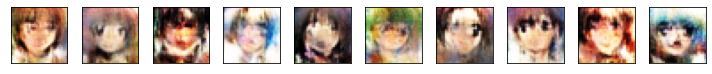

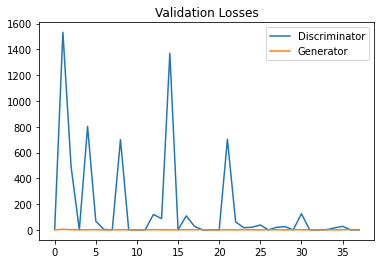

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 30.19it/s]


Epoch:  39/100 Discriminator Loss: 4.5458 Generator Loss: 0.8235


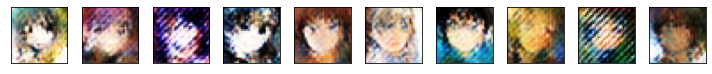

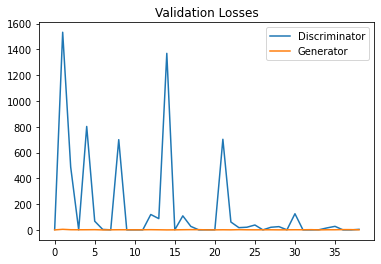

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.74it/s]


Epoch:  40/100 Discriminator Loss: 0.5751 Generator Loss: 1.1355


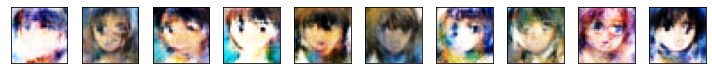

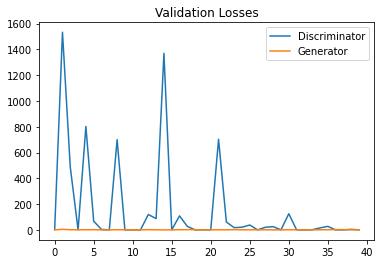

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.65it/s]


Epoch:  41/100 Discriminator Loss: 33.4868 Generator Loss: 3.4883


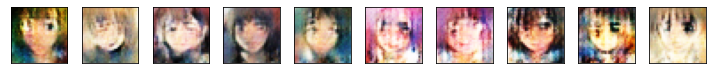

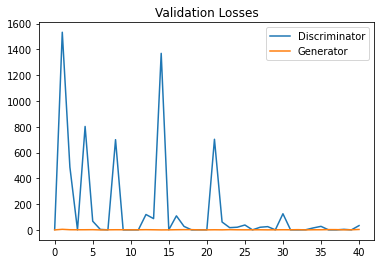

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.50it/s]


Epoch:  42/100 Discriminator Loss: 9.1385 Generator Loss: 1.7450


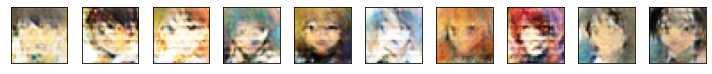

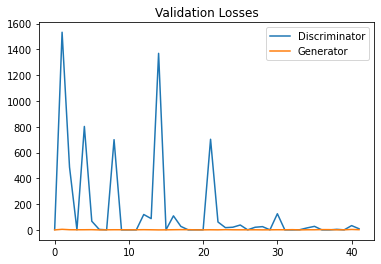

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.15it/s]


Epoch:  43/100 Discriminator Loss: 0.5064 Generator Loss: 1.1370


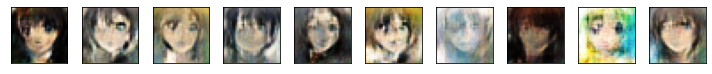

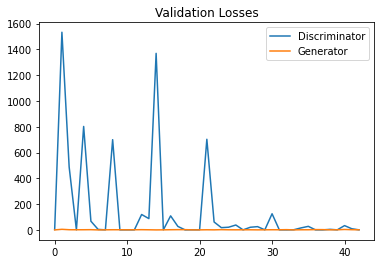

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.51it/s]


Epoch:  44/100 Discriminator Loss: 343.3711 Generator Loss: 2.8340


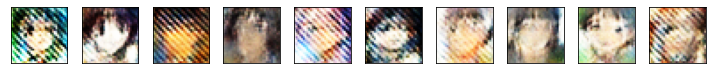

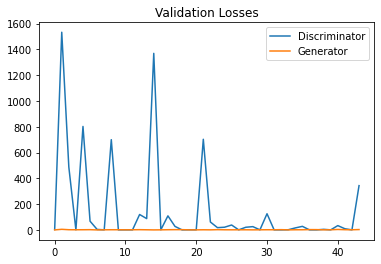

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.28it/s]


Epoch:  45/100 Discriminator Loss: 15.2322 Generator Loss: 1.8680


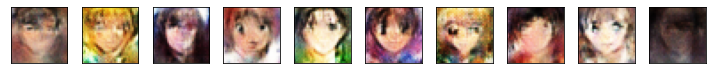

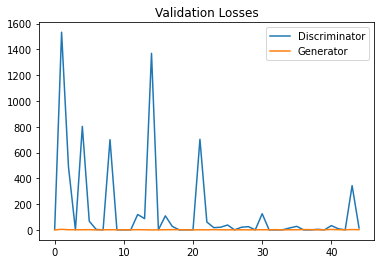

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.98it/s]


Epoch:  46/100 Discriminator Loss: 39.7150 Generator Loss: 2.0052


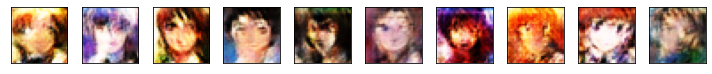

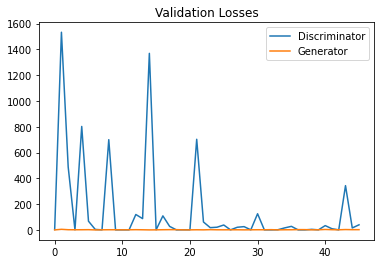

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.92it/s]


Epoch:  47/100 Discriminator Loss: 33.6802 Generator Loss: 2.0271


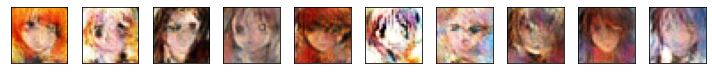

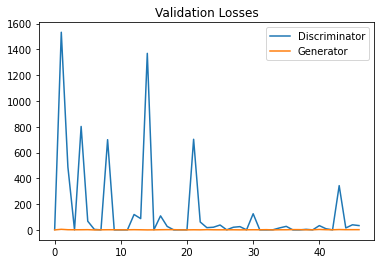

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 29.68it/s]


Epoch:  48/100 Discriminator Loss: 86.6802 Generator Loss: 1.8749


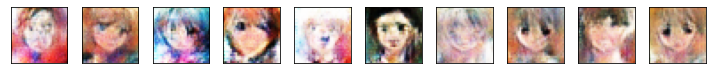

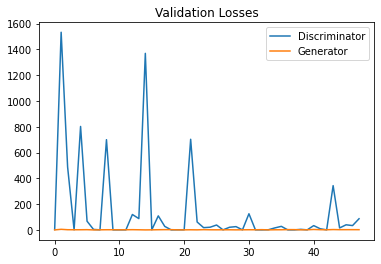

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.89it/s]


Epoch:  49/100 Discriminator Loss: 30.3703 Generator Loss: 2.2484


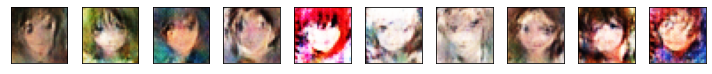

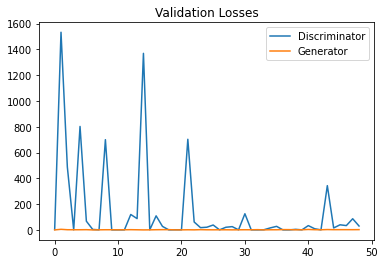

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.97it/s]


Epoch:  50/100 Discriminator Loss: 50.1945 Generator Loss: 1.1146


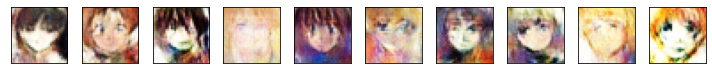

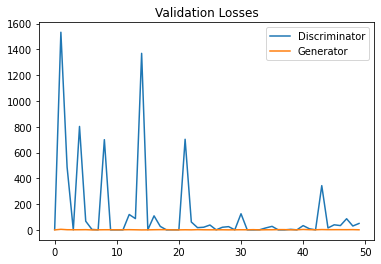

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.79it/s]


Epoch:  51/100 Discriminator Loss: 76.6863 Generator Loss: 3.2068


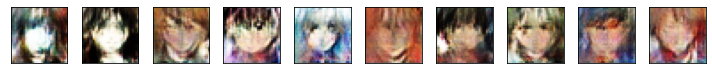

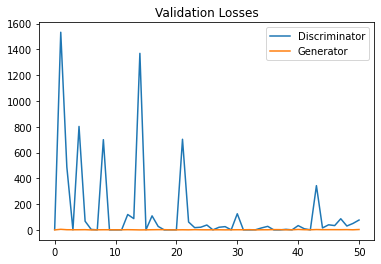

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.43it/s]


Epoch:  52/100 Discriminator Loss: 16.1183 Generator Loss: 1.7616


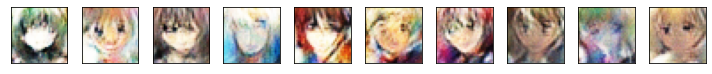

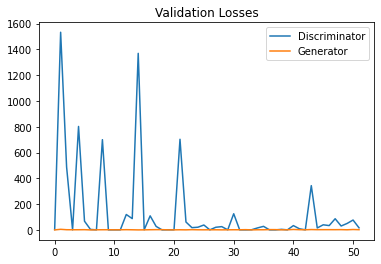

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.42it/s]


Epoch:  53/100 Discriminator Loss: 80.7367 Generator Loss: 2.7328


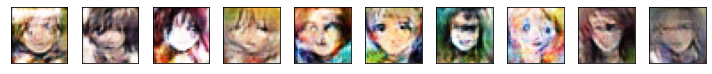

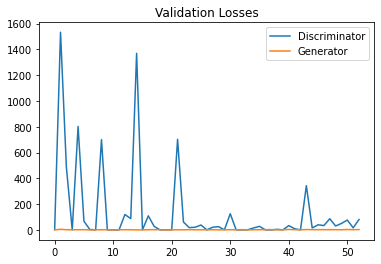

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.29it/s]


Epoch:  54/100 Discriminator Loss: 126.6748 Generator Loss: 1.9977


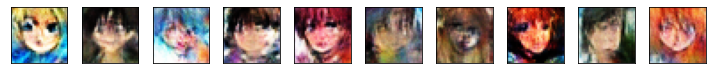

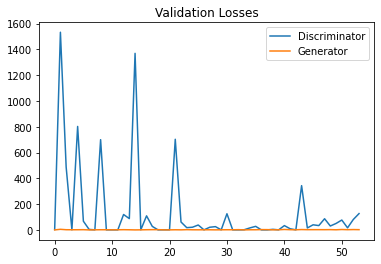

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.98it/s]


Epoch:  55/100 Discriminator Loss: 97.8683 Generator Loss: 2.3902


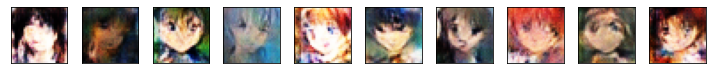

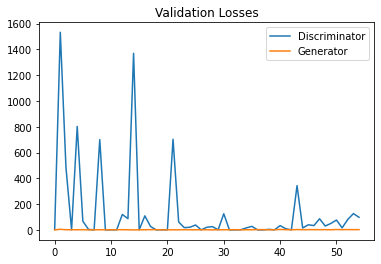

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.65it/s]


Epoch:  56/100 Discriminator Loss: 32.2596 Generator Loss: 1.6660


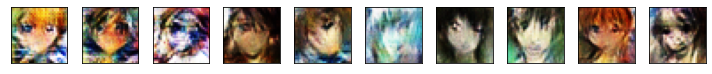

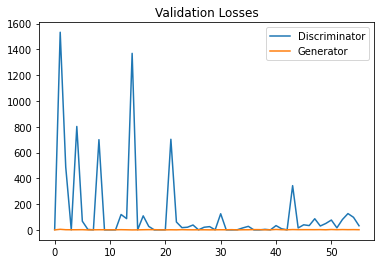

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.01it/s]


Epoch:  57/100 Discriminator Loss: 80.2583 Generator Loss: 1.5665


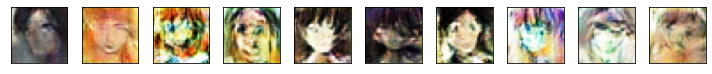

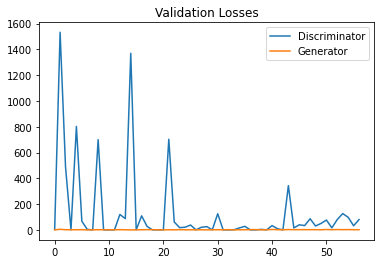

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.45it/s]


Epoch:  58/100 Discriminator Loss: 141.2406 Generator Loss: 2.1183


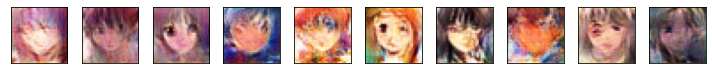

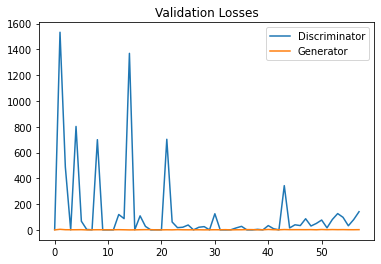

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.34it/s]


Epoch:  59/100 Discriminator Loss: 0.3626 Generator Loss: 1.8032


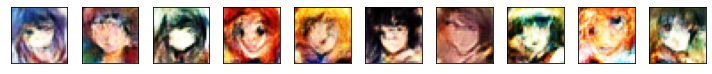

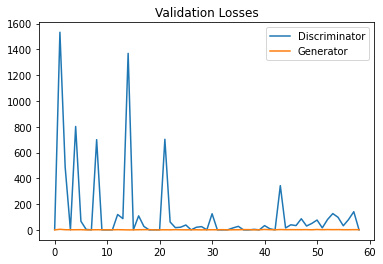

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.14it/s]


Epoch:  60/100 Discriminator Loss: 0.5133 Generator Loss: 1.3287


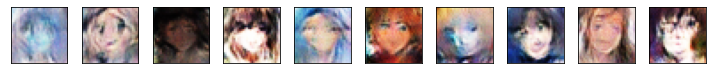

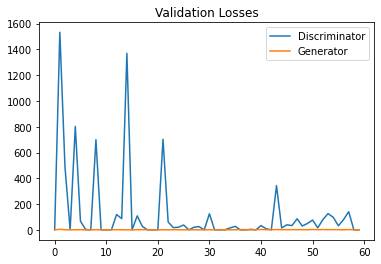

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.41it/s]


Epoch:  61/100 Discriminator Loss: 0.0547 Generator Loss: 4.0634


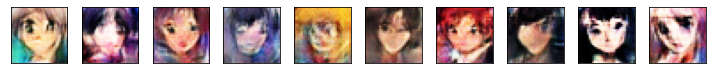

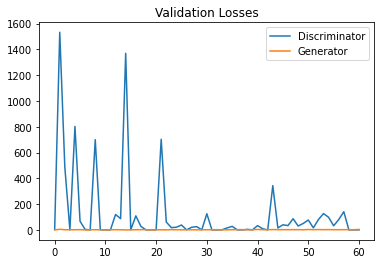

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.50it/s]


Epoch:  62/100 Discriminator Loss: 401.7546 Generator Loss: 2.0566


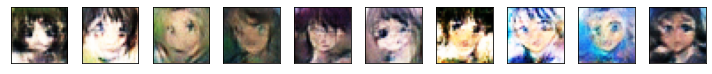

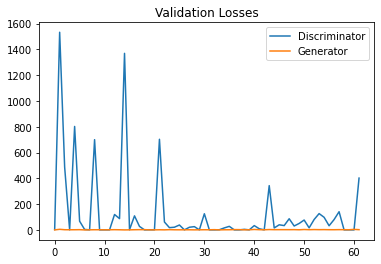

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.45it/s]


Epoch:  63/100 Discriminator Loss: 39.4992 Generator Loss: 1.9613


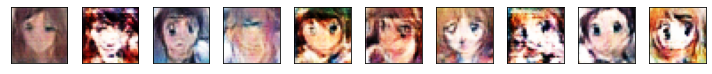

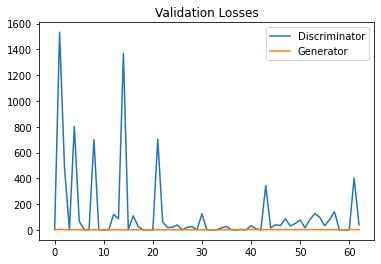

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.33it/s]


Epoch:  64/100 Discriminator Loss: 124.7288 Generator Loss: 2.2381


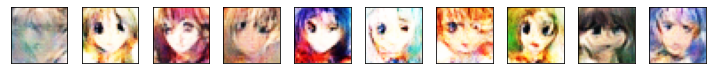

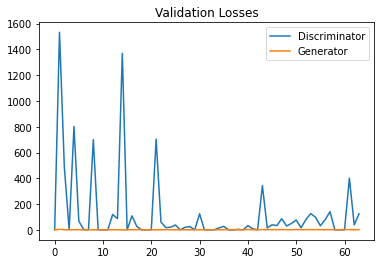

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.44it/s]


Epoch:  65/100 Discriminator Loss: 391.7225 Generator Loss: 3.3783


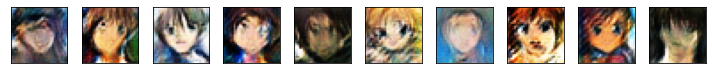

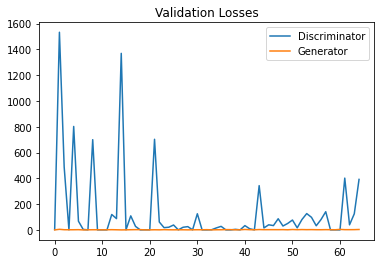

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.51it/s]


Epoch:  66/100 Discriminator Loss: 221.7530 Generator Loss: 3.0356


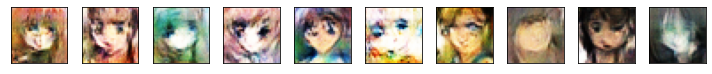

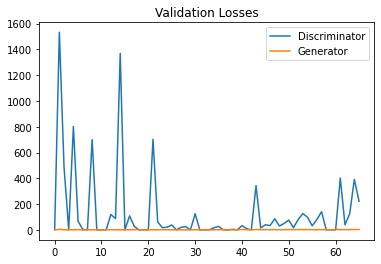

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.68it/s]


Epoch:  67/100 Discriminator Loss: 15.1002 Generator Loss: 2.9286


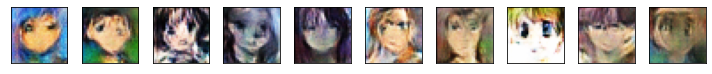

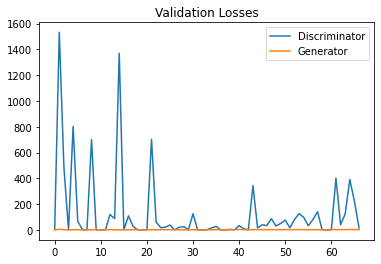

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.37it/s]


Epoch:  68/100 Discriminator Loss: 0.2006 Generator Loss: 2.0848


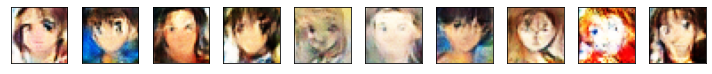

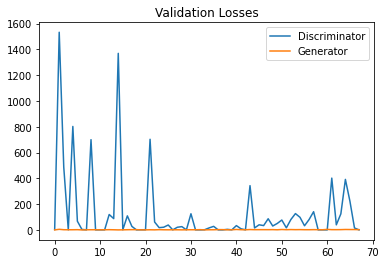

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.05it/s]


Epoch:  69/100 Discriminator Loss: 13.9374 Generator Loss: 2.0564


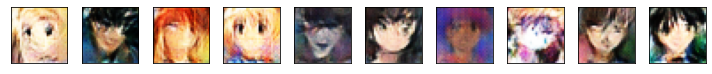

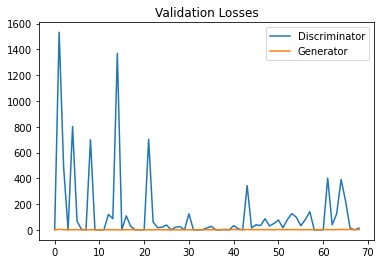

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.16it/s]


Epoch:  70/100 Discriminator Loss: 0.1241 Generator Loss: 2.5666


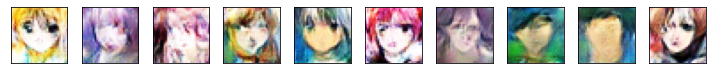

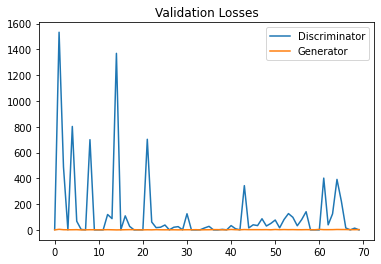

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.57it/s]


Epoch:  71/100 Discriminator Loss: 21.6768 Generator Loss: 2.5038


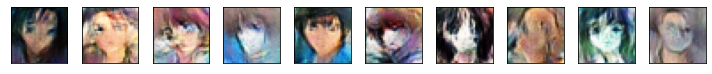

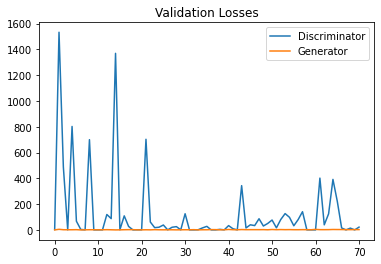

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.27it/s]


Epoch:  72/100 Discriminator Loss: 221.4878 Generator Loss: 2.4908


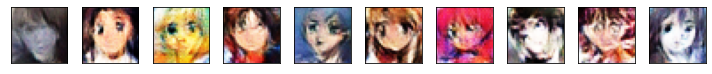

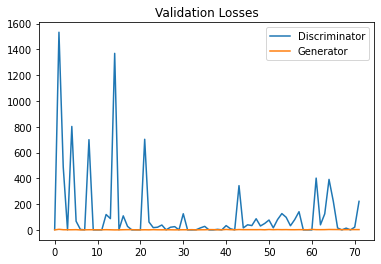

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.58it/s]


Epoch:  73/100 Discriminator Loss: 20.1587 Generator Loss: 3.5250


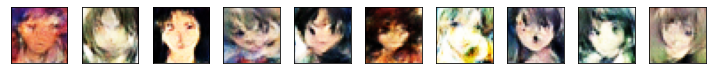

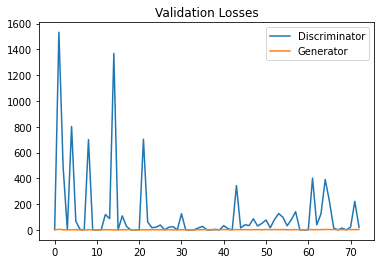

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.19it/s]


Epoch:  74/100 Discriminator Loss: 41.4483 Generator Loss: 3.0491


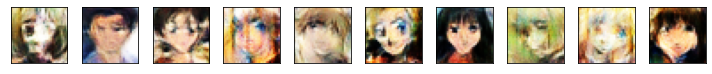

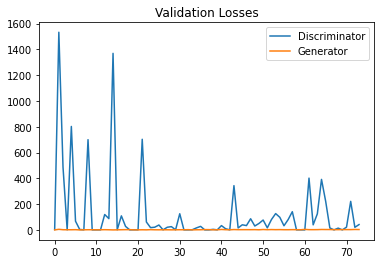

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.36it/s]


Epoch:  75/100 Discriminator Loss: 0.1833 Generator Loss: 2.1372


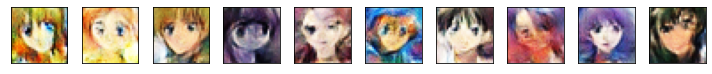

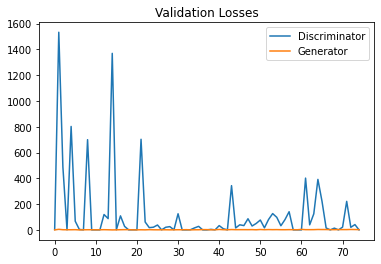

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.27it/s]


Epoch:  76/100 Discriminator Loss: 53.6058 Generator Loss: 2.4988


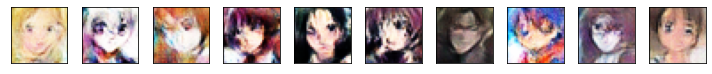

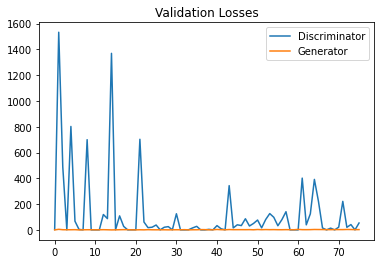

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.23it/s]


Epoch:  77/100 Discriminator Loss: 22.1236 Generator Loss: 2.6314


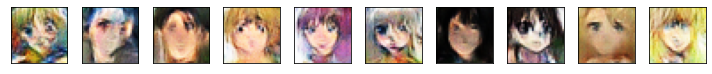

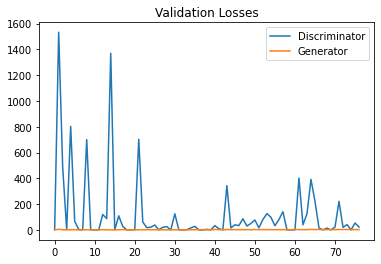

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.28it/s]


Epoch:  78/100 Discriminator Loss: 0.0653 Generator Loss: 3.5016


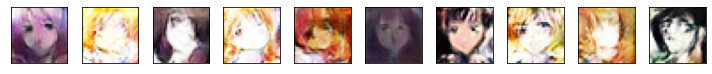

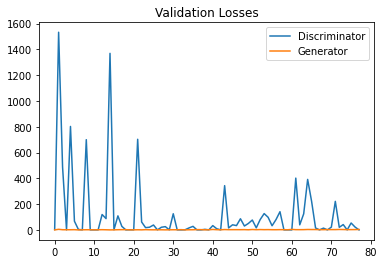

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.16it/s]


Epoch:  79/100 Discriminator Loss: 13.9479 Generator Loss: 3.0320


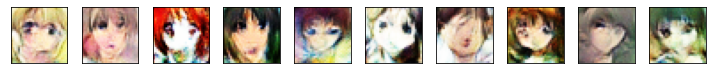

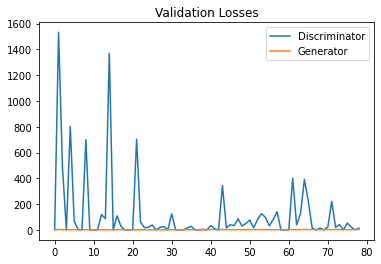

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.44it/s]


Epoch:  80/100 Discriminator Loss: 5.2013 Generator Loss: 3.5287


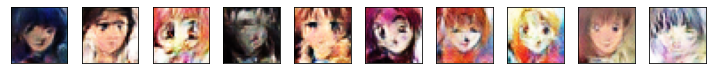

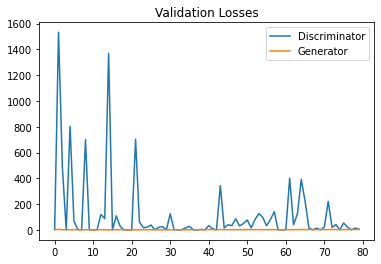

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.07it/s]


Epoch:  81/100 Discriminator Loss: 123.3235 Generator Loss: 2.2227


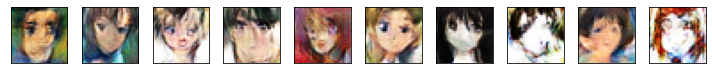

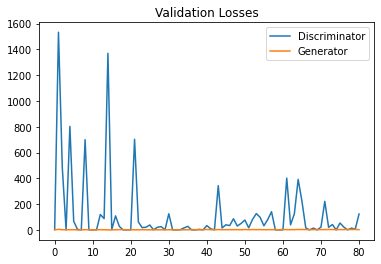

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:07<00:00, 25.74it/s]


Epoch:  82/100 Discriminator Loss: 60.5615 Generator Loss: 1.9354


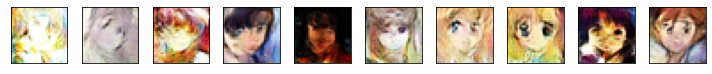

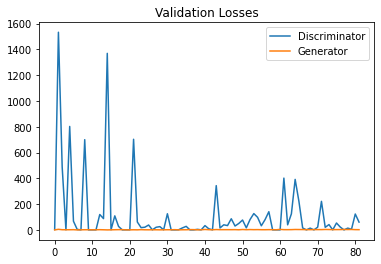

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.43it/s]


Epoch:  83/100 Discriminator Loss: 139.6109 Generator Loss: 3.1720


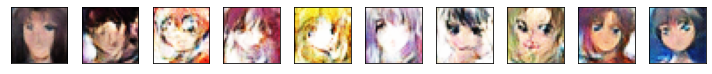

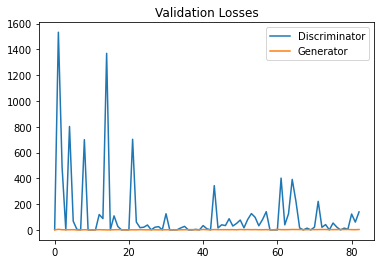

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.55it/s]


Epoch:  84/100 Discriminator Loss: 46.6343 Generator Loss: 3.0870


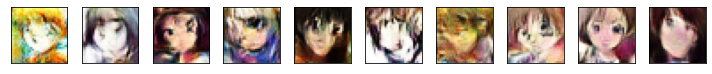

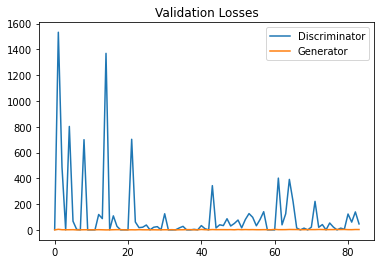

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.22it/s]


Epoch:  85/100 Discriminator Loss: 40.0205 Generator Loss: 4.3333


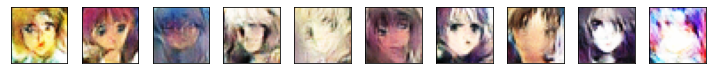

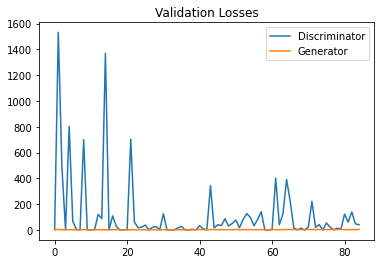

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.98it/s]


Epoch:  86/100 Discriminator Loss: 14.5962 Generator Loss: 3.2024


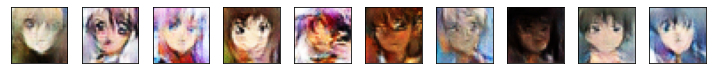

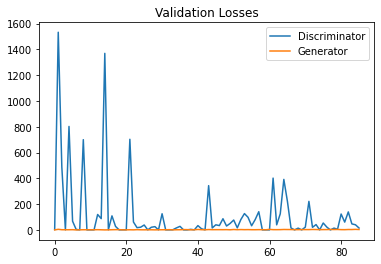

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.58it/s]


Epoch:  87/100 Discriminator Loss: 67.9432 Generator Loss: 2.4742


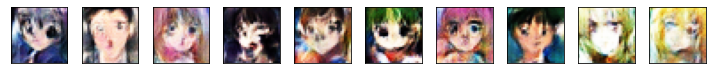

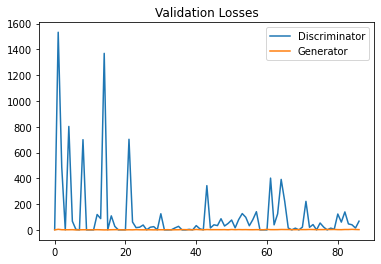

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.46it/s]


Epoch:  88/100 Discriminator Loss: 7.0462 Generator Loss: 2.7425


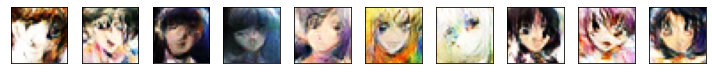

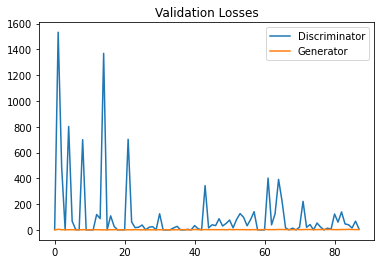

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.09it/s]


Epoch:  89/100 Discriminator Loss: 0.1178 Generator Loss: 2.8259


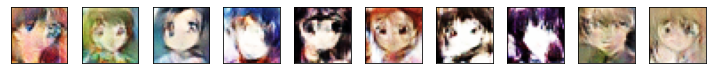

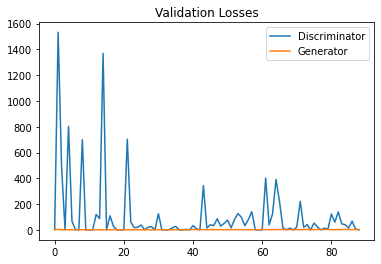

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.24it/s]


Epoch:  90/100 Discriminator Loss: 94.8693 Generator Loss: 2.7161


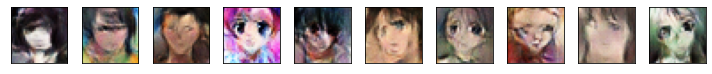

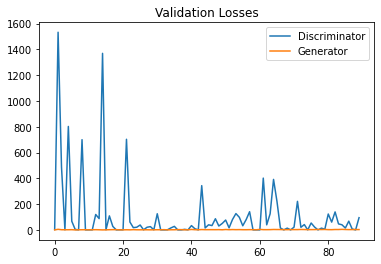

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.11it/s]


Epoch:  91/100 Discriminator Loss: 16.4857 Generator Loss: 3.4005


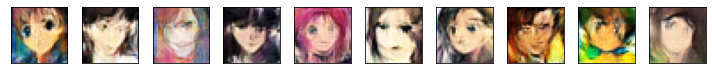

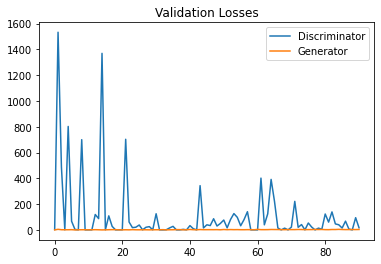

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.13it/s]


Epoch:  92/100 Discriminator Loss: 0.2319 Generator Loss: 2.3030


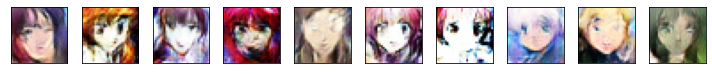

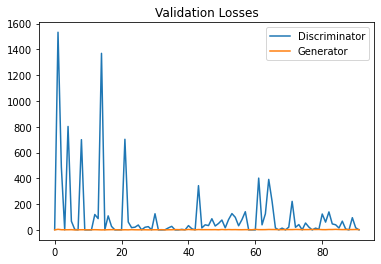

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.01it/s]


Epoch:  93/100 Discriminator Loss: 0.0491 Generator Loss: 3.6919


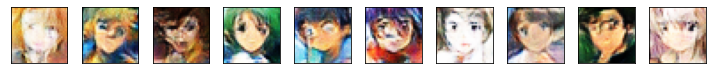

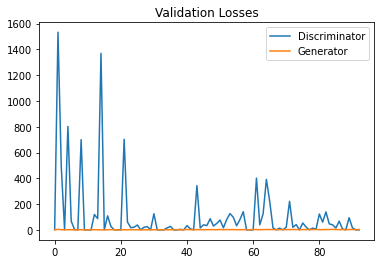

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 27.76it/s]


Epoch:  94/100 Discriminator Loss: 63.3312 Generator Loss: 2.7914


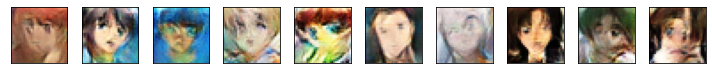

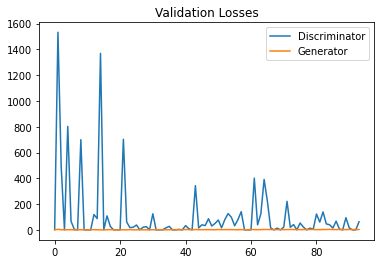

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.63it/s]


Epoch:  95/100 Discriminator Loss: 32.7910 Generator Loss: 3.3899


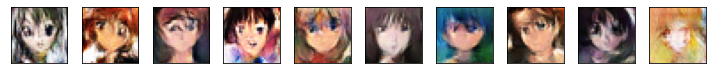

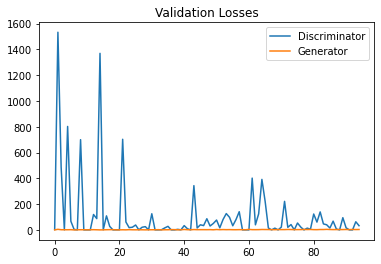

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.41it/s]


Epoch:  96/100 Discriminator Loss: 97.4624 Generator Loss: 2.6855


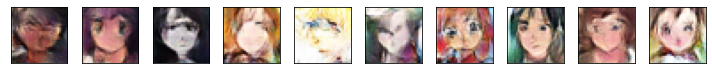

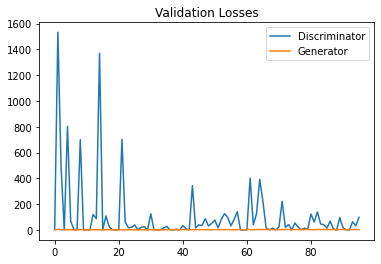

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.34it/s]


Epoch:  97/100 Discriminator Loss: 6.4716 Generator Loss: 3.5329


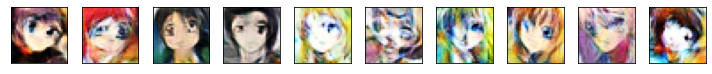

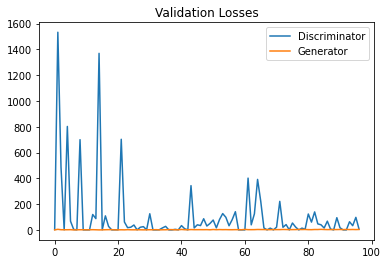

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.41it/s]


Epoch:  98/100 Discriminator Loss: 0.0617 Generator Loss: 3.8941


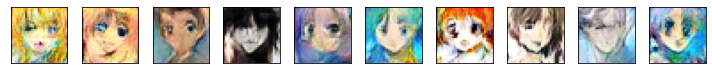

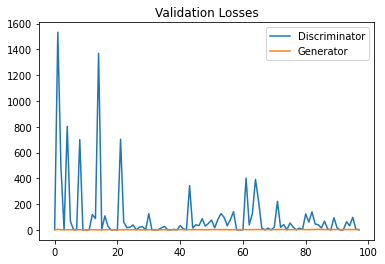

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.03it/s]


Epoch:  99/100 Discriminator Loss: 50.1258 Generator Loss: 3.3105


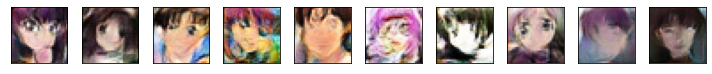

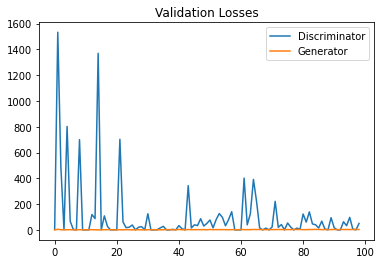

  0%|          | 0/185 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.6/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 185/185 [00:06<00:00, 28.00it/s]


Epoch: 100/100 Discriminator Loss: 307.4836 Generator Loss: 2.4673


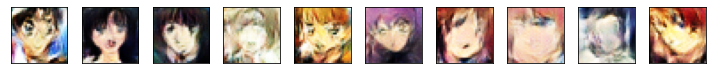

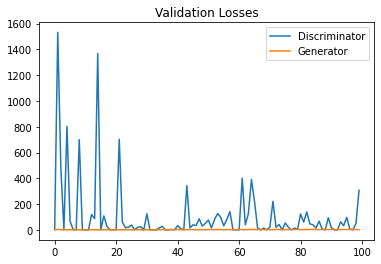

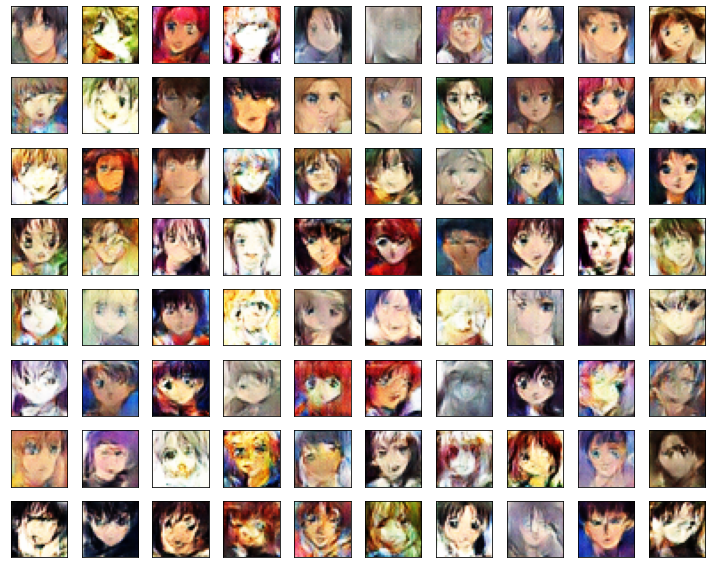

In [ ]:
for e in range(epochs):
    for i in tqdm(range(len(X_train)//batch_size)):
        # real CelebA images
        X_batch_real = X_train_norm[i*batch_size:(i+1)*batch_size]
         # latent samples and the generated digit images
        latent_samples = make_latent_samples(batch_size, sample_size)
        X_batch_fake = generator.predict_on_batch(latent_samples)
        
        # train the discriminator to detect real and fake images
        make_trainable(discriminator, True)        
        discriminator.train_on_batch(X_batch_real, y_train_real * (1 - smooth))
        discriminator.train_on_batch(X_batch_fake, y_train_fake)
        
        # train the generator via GAN
        make_trainable(discriminator, False)
        gan.train_on_batch(latent_samples, y_train_real)
    
    # evaluate
    X_eval_real = X_test_norm[np.random.choice(len(X_test), eval_size, replace=False)]    
    latent_samples = make_latent_samples(eval_size, sample_size)
    X_eval_fake = generator.predict_on_batch(latent_samples)
    
    d_loss  = discriminator.test_on_batch(X_eval_real, y_eval_real)
    d_loss += discriminator.test_on_batch(X_eval_fake, y_eval_fake)
    g_loss  = gan.test_on_batch(latent_samples, y_eval_real) # we want the fake to be realistic!
    
    losses.append((d_loss, g_loss))
    
    print("Epoch: {:>3}/{} Discriminator Loss: {:>6.4f} Generator Loss: {:>6.4f}".format(
        e+1, epochs, d_loss, g_loss))    
    show_images(X_eval_fake[:10])
    show_losses(losses)
    
# show the result
if show_details:
#    show_losses(losses)
    show_images(generator.predict(make_latent_samples(80, sample_size)))

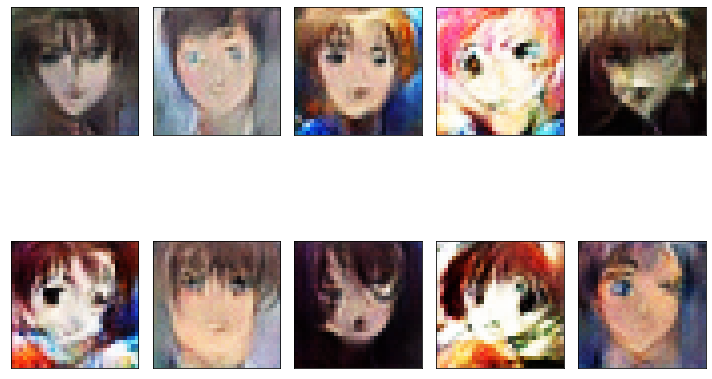

In [ ]:
show_images(generator.predict(make_latent_samples(10, sample_size)), cols=5)

## **References**

<a id="ref1"></a>
### [1] Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks

Alec Radford & Luke Metz (indico Research), Soumith Chintala (Facebook AI Research)

https://arxiv.org/pdf/1511.06434.pdf

<a id="ref2"></a>
### [2] Face Generation Project (Deep Learning Foundactions)
Udacity

https://github.com/udacity/deep-learning/blob/master/face_generation/dlnd_face_generation.ipynb
